### 学习率的对比
- how to put the model-creation and model-training code into  callable functions 如何将模型创建和模型训练代码放入可调用函数中
- How to run parametric experiments with ANN models 如何使用人工神经网络模型进行参数实验
- The effects of learning rate on performance. 学习率对成绩的影响
- That puzzling results provide a great learning opportunity!

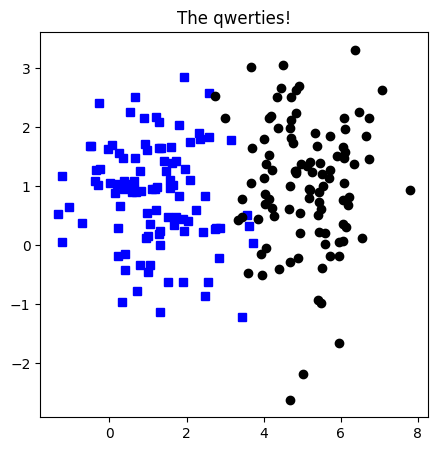

In [92]:
import torch
import torch.nn as nn
import numpy as np

import matplotlib.pyplot as plt
from IPython import display

nPerClust = 100
blur =1

A = [1,1]
B = [5,1]

a = [A[0] + np.random.randn(nPerClust)*blur , A[1] +  np.random.randn(nPerClust) *blur]
b = [B[0] + np.random.randn(nPerClust)*blur , B[1] +  np.random.randn(nPerClust) *blur]


labels_np = np.vstack((np.zeros((nPerClust,1)), np.ones((nPerClust,1))))

data_np = np.hstack((a,b)).T

# 转化成 pytorch tensor 类型
data= torch.tensor(data_np).float()
labels = torch.tensor(labels_np).float()

# 展示

fig = plt.figure(figsize=(5,5))

v =np.where(labels==0)[0]

plt.plot(data[np.where(labels==0)[0],0],data[np.where(labels==0)[0],1],'bs')
plt.plot(data[np.where(labels==1)[0],0],data[np.where(labels==1)[0],1],'ko')
plt.title('The qwerties!')
plt.show()




### 创建并生成模型的函数

In [93]:
def createANNModel(learningRate):
    ANNClassify = nn.Sequential(
        nn.Linear(2,1),
        nn.ReLU(),
        nn.Linear(1,1)
    )
    # Binary Classification Error
    lossFun = nn.BCEWithLogitsLoss()
    optimizer = torch.optim.SGD(ANNClassify.parameters(),lr=learningRate)

    return ANNClassify, lossFun,optimizer

### 训练模型的函数

In [94]:

numepochs = 1000


def trainTheModel(ANNModel, lossFun, optimizer):

    losses = torch.zeros(numepochs)

    for epochi in range(numepochs):

        yHat = ANNModel(data)

        loss = lossFun(yHat, labels)

        losses[epochi] = loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    predictions = ANNModel(data)

    # 当我们显示地使用sigmoid 激活函数，下面 要用 >0.5 而不是0
    # predictions = sigmoid( ANNModel(data))
    # totalacc = 100* torch.mean(((predictions>0.5) == labels).float())
    print("##预测结果",predictions)  
    totalacc = 100 * torch.mean(((predictions > 0) == labels).float())

    return losses, predictions, totalacc

### 测试一次

##预测结果 tensor([[-1.3825],
        [-1.2448],
        [-1.3825],
        [-1.3825],
        [-1.3825],
        [-1.3825],
        [ 0.3039],
        [-0.5107],
        [-1.2446],
        [ 0.0211],
        [-1.3825],
        [-0.7757],
        [-1.0925],
        [ 1.0852],
        [-1.3825],
        [-0.1973],
        [-1.3825],
        [-1.3825],
        [-1.3825],
        [-1.3825],
        [-1.3825],
        [-0.0339],
        [-0.6962],
        [-1.3825],
        [-1.2568],
        [-1.3825],
        [-1.3825],
        [-1.1209],
        [-1.1732],
        [-1.3825],
        [-1.3825],
        [-1.3825],
        [-1.3825],
        [-1.3825],
        [-1.3825],
        [-0.2130],
        [-1.3825],
        [-1.3825],
        [-1.3825],
        [-1.2662],
        [-1.3825],
        [-1.3825],
        [-1.3825],
        [-1.3825],
        [-0.4501],
        [-1.3825],
        [-0.6504],
        [-0.9832],
        [-1.1363],
        [-0.4594],
        [-1.3825],
        [-1.3825],
     

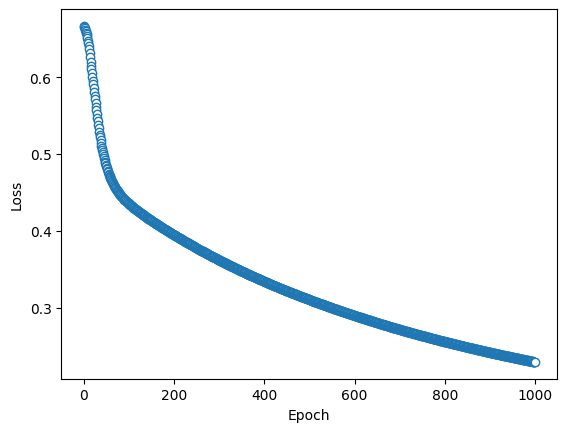

In [95]:

ANNModel,lossFun,optimizer = createANNModel(.01)

lossess,predictions,totalacc =trainTheModel(ANNModel,lossFun,optimizer)

print(totalacc)
plt.plot(lossess.detach(),'o',markerfacecolor='w',linewidth=.1)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()


### 开始实验

In [96]:

learningRates = np.linspace(.001,.1,40)
accByLR = []
allLosses = np.zeros((len(learningRates),numepochs))

for i,lr in enumerate(learningRates):
    
    ANNModel,lossFun,optimizer = createANNModel(lr)
    losses,predictions,totalacc = trainTheModel(ANNModel,lossFun,optimizer) 

    accByLR.append(totalacc)
    allLosses[i,:] = losses.detach()

##预测结果 tensor([[0.3884],
        [0.4386],
        [0.3652],
        [0.3340],
        [0.3340],
        [0.3340],
        [0.7879],
        [0.5138],
        [0.5035],
        [0.7738],
        [0.3340],
        [0.5911],
        [0.4157],
        [0.9782],
        [0.4922],
        [0.6812],
        [0.3872],
        [0.3340],
        [0.3658],
        [0.3340],
        [0.4066],
        [0.7833],
        [0.6653],
        [0.5050],
        [0.4661],
        [0.3340],
        [0.3340],
        [0.4544],
        [0.4756],
        [0.3340],
        [0.4431],
        [0.4345],
        [0.3340],
        [0.3416],
        [0.3340],
        [0.6342],
        [0.3340],
        [0.3340],
        [0.3340],
        [0.4554],
        [0.3340],
        [0.3340],
        [0.4006],
        [0.3340],
        [0.5301],
        [0.3340],
        [0.5988],
        [0.5177],
        [0.5986],
        [0.6143],
        [0.4024],
        [0.3340],
        [0.3340],
        [0.3340],
        [0.7295],
   

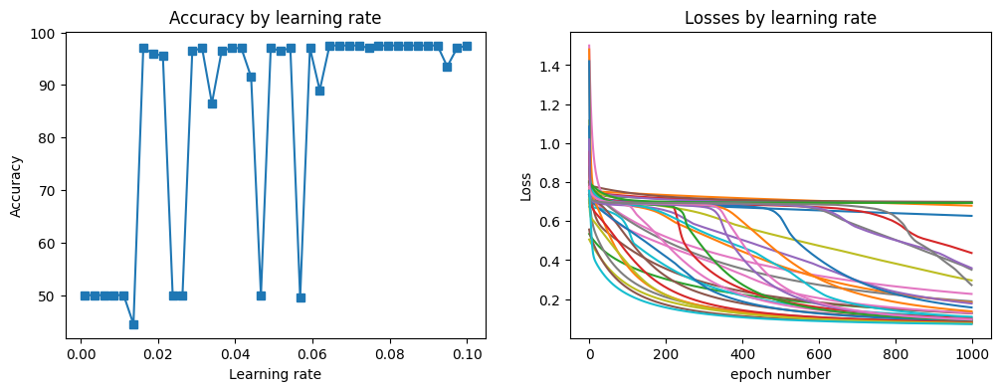

In [97]:

fig,ax = plt.subplots(1,2,figsize=(12,4))

ax[0].plot(learningRates,accByLR,'s-')
ax[0].set_xlabel('Learning rate')
ax[0].set_ylabel('Accuracy')
ax[0].set_title('Accuracy by learning rate')

ax[1].plot(allLosses.T)
ax[1].set_title('Losses by learning rate')
ax[1].set_xlabel('epoch number')
ax[1].set_ylabel('Loss')
plt.show()

In [98]:
# proportion of runs where the model had at least 70% accuracy
# 求准确率大于70%的比例
sum(torch.tensor(accByLR) > 70) /len(accByLR)


tensor(0.7500)


### 再次训练


In [99]:

numExps = 50

accMeta = np.zeros((numExps,len(learningRates)))

# accMeta[1,1] =

print(accMeta)

numepochs = 500

for expi in range(numExps):
    for i,lr in enumerate(learningRates):
        
        ANN,lossFun,optimizer = createANNModel(lr)
        losses,predictions,totalacc = trainTheModel(ANN,lossFun,optimizer)

        accMeta[expi,i] =totalacc
        



[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
##预测结果 tensor([[-0.4936],
        [-0.5552],
        [-0.3125],
        [-0.6361],
        [-0.6549],
        [-0.4805],
        [-0.3125],
        [-0.6222],
        [-0.3600],
        [-0.3125],
        [-0.4434],
        [-0.3125],
        [-0.6850],
        [-0.3125],
        [-0.3125],
        [-0.3125],
        [-0.3125],
        [-0.5478],
        [-0.6328],
        [-0.7293],
        [-0.4914],
        [-0.3125],
        [-0.3125],
        [-0.3125],
        [-0.4678],
        [-0.7533],
        [-0.7544],
        [-0.5573],
        [-0.4726],
        [-0.8189],
        [-0.3222],
        [-0.3190],
        [-0.7560],
        [-0.5045],
        [-0.6563],
        [-0.3791],
        [-0.6906],
        [-0.5842],
        [-0.5513],
        [-0.4961],
        [-0.5552],
        [-0.4032],
        [-0.4893],
        [-0.7221],
 

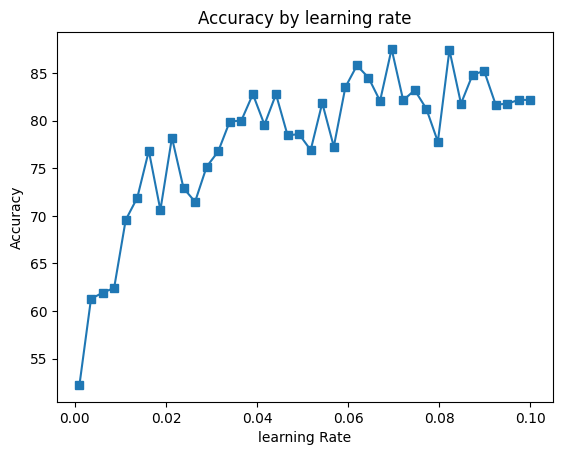

In [100]:
plt.plot(learningRates,np.mean(accMeta,axis=0),'s-')
plt.xlabel('learning Rate')
plt.ylabel('Accuracy')
plt.title('Accuracy by learning rate')
plt.show()